In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import sys
import os.path

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))
from UniformTrees.ust import Grafo, erase_loops

[8, 4]
[1 3]


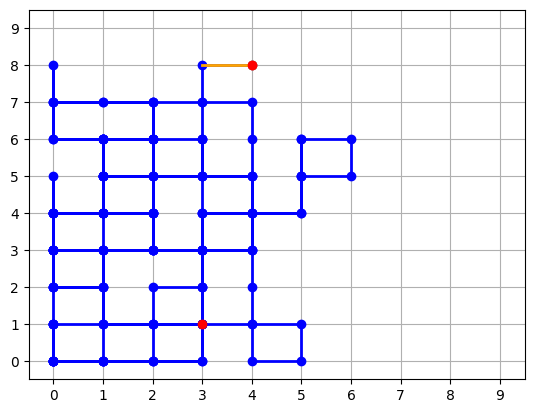

In [18]:
grafo = Grafo()
f = grafo.get_start()
print(f)
a = np.random.randint(0, 10, 2)
print(a)
arr, d = grafo.random_walk(a)
M = grafo.grid

m, n = M.shape
fig, ax = plt.subplots()
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, m-0.5)
ax.set_xticks(np.arange(M.shape[0]))
ax.set_yticks(np.arange(M.shape[1]))
ax.grid(True)

# Colores para puntos iniciales `a` y `f`



xdata, ydata = [], []
(line,) = ax.plot([], [], color='blue', marker='o', linestyle='-', lw=2)
(last_edge,) = ax.plot([], [], color='orange', linestyle='-', lw=2)
(current,) = ax.plot([], [], color='orange', marker='o')
ax.plot(a[1], a[0], 'ro', label='Punto a')  # punto `a` en rojo
ax.plot(f[1], f[0], 'ro', label='Punto f')  # punto `f` en rojo

def init():
    line.set_data([], [])
    last_edge.set_data([], [])
    current.set_data([], [])
    return line, last_edge, current

def update(frame):
    x, y = arr[frame]

    xdata.append(x)
    ydata.append(y)

    line.set_data(ydata, xdata)

    if frame > 0:
        last_edge.set_data([ydata[-2], ydata[-1]], [xdata[-2], xdata[-1]])
        current.set_data([ydata[-1]], [xdata[-1]])
    else:
        last_edge.set_data([], [])
        current.set_data([], [])

    return line, last_edge, current


anim = FuncAnimation(fig,
                     update,
                     frames=len(arr),
                     init_func=init,
                     blit=True,
                     interval=150)

# HTML(anim.to_jshtml())
anim.save('random_walk.mp4', writer='ffmpeg')

In [9]:
arr_copy = np.array(arr).copy()
d_copy = np.array(d).copy()

In [61]:
print(np.shape(arr_copy), np.shape(d_copy))

(870, 2) (869,)


In [62]:
arr = np.array(arr_copy).copy()
d = np.array(d_copy).copy()

In [63]:
print(np.shape(arr), np.shape(d))

(870, 2) (869,)


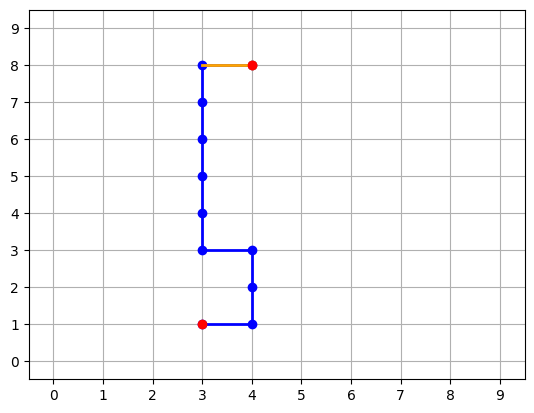

In [21]:
lerw, _ = erase_loops(arr, d)
arr = lerw
fig, ax = plt.subplots()
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, m-0.5)
ax.set_xticks(np.arange(M.shape[0]))
ax.set_yticks(np.arange(M.shape[1]))
ax.grid(True)
xdata, ydata = [], []
(line,) = ax.plot([], [], color='blue', marker='o', linestyle='-', lw=2)
(last_edge,) = ax.plot([], [], color='orange', linestyle='-', lw=2)
(current,) = ax.plot([], [], color='orange', marker='o')
ax.plot(a[1], a[0], 'ro', label='Punto a')  # punto `a` en rojo
ax.plot(f[1], f[0], 'ro', label='Punto f')  # punto `f` en rojo

def init():
    line.set_data([], [])
    last_edge.set_data([], [])
    current.set_data([], [])
    return line, last_edge

def update(frame):
    x, y = arr[frame]

    xdata.append(x)
    ydata.append(y)

    line.set_data(ydata, xdata)

    if frame > 0:
        last_edge.set_data([ydata[-2], ydata[-1]], [xdata[-2], xdata[-1]])
        current.set_data([ydata[-1]], [xdata[-1]])
    else:
        last_edge.set_data([], [])
        current.set_data([], [])

    return line, last_edge

anim = FuncAnimation(fig,
                     update,
                     frames=len(arr),
                     init_func=init,
                     blit=True,
                     interval=250)

# HTML(anim.to_jshtml())

anim.save('loop_erased.mp4', writer='ffmpeg')

In [1]:
5%2

1

[4, 7]


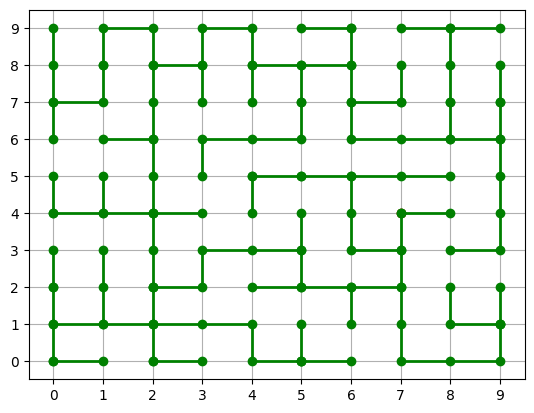

In [10]:
grafo = Grafo()
f = grafo.get_start()
print(f)
s = grafo.wilson()

# Extraer los recorridos con ciclos (pares) y los caminos sin ciclos (impares)
walks_with_cycles = [s[i] for i in range(len(s)) if i % 2 == 0]
paths_without_cycles = [s[i] for i in range(len(s)) if i % 2 == 1]

# Convertir en una lista combinada para la animación
steps = []
for walk, path in zip(walks_with_cycles, paths_without_cycles):
    steps.extend([(walk, 'cycle')])  # Agregar recorrido con ciclos
    steps.extend([(path, 'path')])  # Agregar camino sin ciclos

M = grafo.grid
m, n = M.shape
fig, ax = plt.subplots()
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, m-0.5)
ax.set_xticks(np.arange(M.shape[0]))
ax.set_yticks(np.arange(M.shape[1]))
ax.grid(True)

# Punto inicial en rojo
ax.plot(f[1], f[0], 'ro', label='Punto a')  # punto `a` en rojo

# Lista para manejar las líneas acumuladas
lines = []
current_line = None

# Colores
cycle_color = 'orange'  # Color para el recorrido con ciclos
path_color = 'blue'     # Color para el camino sin ciclos
final_color = 'green'   # Color para el árbol final

def init():
    return lines

def update(frame):
    global current_line
    segment, segment_type = steps[frame]  # Tipo del segmento (cycle o path)
    
    if current_line:
        # Si estamos procesando un camino sin ciclos, borramos la línea con ciclos previa
        if segment_type == 'path' and current_line.get_color() == cycle_color:
            current_line.remove()
            current_line = None

    xdata, ydata = zip(*segment)
    
    if segment_type == 'cycle':
        # Dibujar el recorrido con ciclos temporalmente
        current_line, = ax.plot(ydata, xdata, color=cycle_color, marker='o', linestyle='-', lw=2)
    elif segment_type == 'path':
        # Dibujar el camino sin ciclos definitivo
        line, = ax.plot(ydata, xdata, color=path_color, marker='o', linestyle='-', lw=2)
        lines.append(line)  # Guardar esta línea como parte del árbol
    
    # Si llegamos al último frame, cambiar todos los colores a "final_color"
    if frame == len(steps) - 1:
        for line in lines:
            line.set_color(final_color)
    return lines


anim = FuncAnimation(fig,
                     update,
                     frames=len(steps),
                     init_func=init,
                     blit=False,  # Necesario para redibujar todo
                     interval=500)

HTML(anim.to_jshtml())


[9, 4]


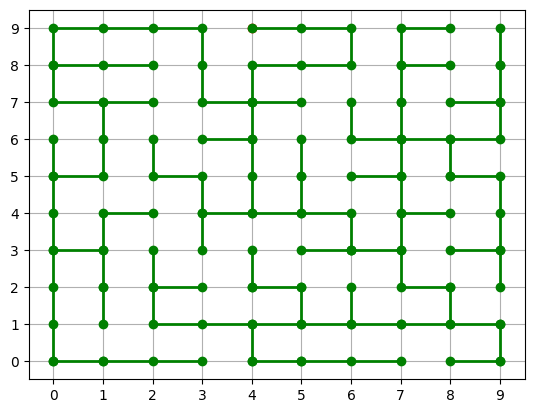

In [ ]:
grafo = Grafo()
f = grafo.get_start()
print(f)
s = grafo.wilson()

# Extraer los recorridos con ciclos (pares) y los caminos sin ciclos (impares)
walks_with_cycles = [s[i] for i in range(len(s)) if i % 2 == 0]
paths_without_cycles = [s[i] for i in range(len(s)) if i % 2 == 1]

# Combinar pasos en un formato manejable
steps = []
for walk, path in zip(walks_with_cycles, paths_without_cycles):
    steps.append((walk, 'cycle'))  # Agregar recorrido con ciclos
    steps.append((path, 'path'))  # Agregar camino sin ciclos

M = grafo.grid
m, n = M.shape
fig, ax = plt.subplots()
ax.set_xlim(-0.5, n-0.5)
ax.set_ylim(-0.5, m-0.5)
ax.set_xticks(np.arange(M.shape[0]))
ax.set_yticks(np.arange(M.shape[1]))
ax.grid(True)

# Punto inicial en rojo
ax.plot(f[1], f[0], 'ro', label='Punto a')  # Punto `a` en rojo

# Variables para manejar la animación
lines = []
xdata, ydata = [], []
current_line = None

# Colores
cycle_color = 'orange'  # Color para el recorrido con ciclos
path_color = 'blue'     # Color para el camino sin ciclos
final_color = 'red'   # Color para el árbol final

# Control del progreso en el segmento actual
current_segment = None
segment_index = 0

def init():
    return []

def update(frame):
    global current_line, current_segment, segment_index, xdata, ydata

    # Si no hay un segmento en curso, tomar el siguiente
    if current_segment is None or segment_index >= len(current_segment[0]):
        if not steps:
            return []  # Terminar si no hay más segmentos
        current_segment = steps.pop(0)
        segment_index = 0
        xdata, ydata = [], []  # Reiniciar los datos de la animación

    segment, segment_type = current_segment

    if segment_type == 'cycle':
        # Avanzar punto por punto en el recorrido con ciclos
        x, y = segment[segment_index]
        xdata.append(x)
        ydata.append(y)
        segment_index += 1

        # Dibujar el recorrido con ciclos de manera temporal
        if current_line:
            current_line.remove()
        current_line, = ax.plot(ydata, xdata, color=cycle_color, marker='o', linestyle='-', lw=2)

        # Si llegamos al final del segmento, prepararse para el camino
        if segment_index == len(segment):
            if current_line:
                current_line.remove()
                current_line = None

    elif segment_type == 'path':
        # Mostrar todo el camino sin ciclos de golpe
        xdata, ydata = zip(*segment)  # Extraer todas las coordenadas
        line, = ax.plot(ydata, xdata, color=path_color, marker='o', linestyle='-', lw=2)
        lines.append(line)
        current_segment = None  # Terminar este segmento

    # Cambiar el color al final de todo
    if not steps and current_segment is None:
        for line in lines:
            line.set_color(final_color)

    return lines + ([current_line] if current_line else [])


anim = FuncAnimation(fig,
                     update,
                     frames=sum(len(seg[0]) for seg in steps),
                     init_func=init,
                     blit=False,  # Necesario para redibujar todo
                     interval=500)

HTML(anim.to_jshtml())